# 

# 

In [8]:
import uproot
from utilities.io_tools import input_tools,combinetf2_input,combinetf_input
from utilities import boostHistHelpers as hh
from wremnants import histselections as sel
from wremnants import plot_tools
import hist
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [2]:
%load_ext autoreload
%autoreload 2

In [18]:
def hist_to_up_down_unc(h):
    hunc = h.copy()
    hunc.values(flow=True)[...] = np.sqrt(h.variances(flow=True))
    hup = hh.addHists(h, hunc)
    hdown = hh.addHists(h, hunc, scale2=-1)
    return hup, hdown

In [19]:
res_n3ll_data = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen/dataFit_N3LL_results.hdf5")

In [18]:
res_n2p1ll_data = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen/dataFit_N2p1LL_results.hdf5")

In [29]:
res_n3p0ll_data = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen/dataFit_N3p0LL_results.hdf5")


In [16]:
res_n3ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"]

Hist(Variable(array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40.]), underflow=False, name='ptVgen'), storage=Weight()) # Sum: WeightedSum(value=1.79192e+06, variance=0)

# 

/opt/venv/lib/python3.11/site-packages/mplhep/error_estimation.py:49: RuntimeWarning: divide by zero encountered in divide
  counts = sumw / scale


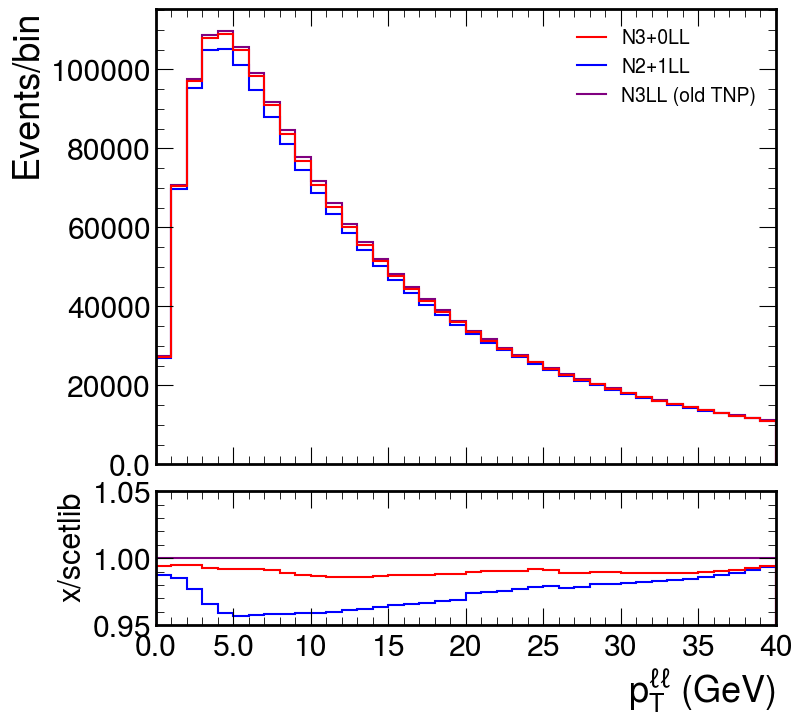

In [30]:
fig = plot_tools.makePlotWithRatioToRef(
            hists=[
                res_n3ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"],
                res_n2p1ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"],
                res_n3p0ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"],
            ],
            labels=["N3LL (old TNP)",
                   "N2+1LL",
                    "N3+0LL",
                   ],
            colors=["purple",
                    "blue",
                    "red",
                   ],
            xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
            ylabel="Events/bin",
            rlabel="x/scetlib",
            rrange=[0.95, 1.05],
            nlegcols=1,
            xlim=None, binwnorm=1.0, baseline=True, 
    )

/opt/venv/lib/python3.11/site-packages/mplhep/error_estimation.py:49: RuntimeWarning: divide by zero encountered in divide
  counts = sumw / scale


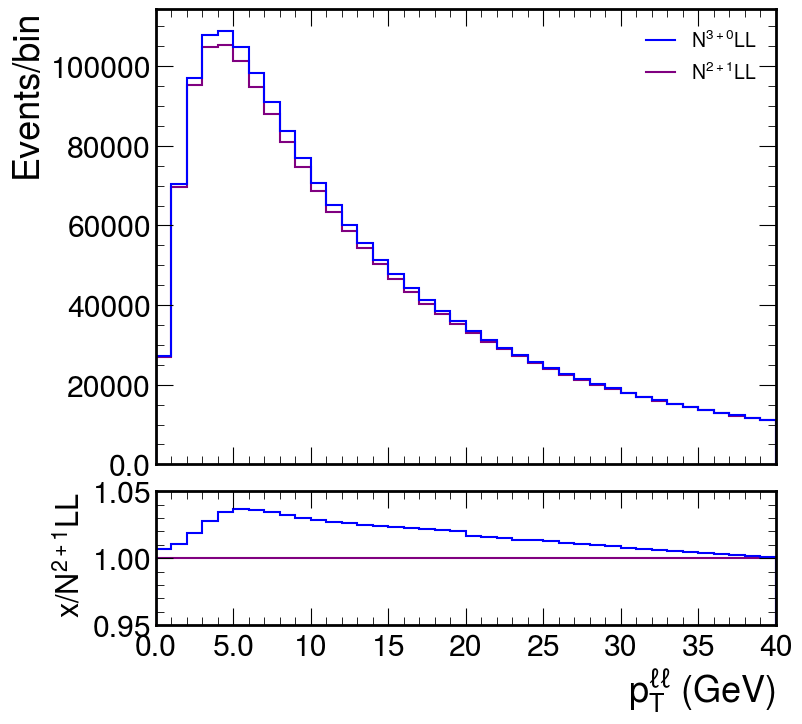

In [33]:
fig = plot_tools.makePlotWithRatioToRef(
            hists=[
                res_n2p1ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"],
                res_n3p0ll_data["hist_postfit"]["ch0"].get()[...,"Zmumu"],
            ],
            labels=["N$^{2+1}$LL",
                    "N$^{3+0}$LL",
                   ],
            colors=["purple",
                    "blue",
                   ],
            xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
            ylabel="Events/bin",
            rlabel="x/N$^{2+1}$LL",
            rrange=[0.95, 1.05],
            nlegcols=1,
            xlim=None, binwnorm=1.0, baseline=True, 
    )

In [6]:
import pickle

In [174]:
unfolded_data = pickle.load(open("/scratch/submit/cms/kdlong/CombineStudies/Unfolding/ZMassDilepton_ptll_yll_Data/results_unfolded.pkl", "rb"))

In [183]:
unfolded_exp = pickle.load(open("/scratch/submit/cms/kdlong/CombineStudies/Unfolding/ZMassDilepton_ptll_yll/results_unfolded_expected.pkl", "rb"))

In [184]:
unfolded_exph = unfolded_exp["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptVGen"]

In [176]:
unfolded_datah = unfolded_data["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptVGen"]

In [410]:
unfolded_exp["results"]["pmaskedexp"]["chan_13TeV"]["Z"].keys()

dict_keys(['hist_ptVGen', 'hist_ptVGen_stat', 'hist_ptVGen_syst'])

In [190]:
hfid = input_tools.read_and_scale("/scratch/submit/cms/kdlong/Analysis/w_z_gen_dists_scetlib_dyturboN3p0LLCorr_fiducial.hdf5", "ZmumuPostVFP", "nominal_gen")

In [173]:
hdata = unfolded["results"]["sumpois"]["chan_13TeV"]["Z"]["hist_ptVGen"]

KeyError: 'sumpois'

In [154]:
unfolded["results"]["sumpois"]["chan_13TeV"]["Z"]["hist_absYVGen"]

Hist(Regular(10, 0, 2.5, underflow=False, overflow=False, name='absYVGen'), storage=Weight()) # Sum: WeightedSum(value=619.376, variance=8.61191)

In [191]:
hfid_pt = hh.rebinHist(hfid.project("ptVgen"), "ptVgen", hdata.axes[0].edges)

In [112]:
postfit = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen_fiducial/ZGen_postfit_recoFitToData.hdf5")

In [235]:
#postfit_combine = combinetf_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen_fiducial/fitresults_123456791.hdf5")

In [113]:
postfit_pt = hh.rebinHist(postfit["hist_postfit"]["ch0"].get(), "ptVgen", hdata.axes[0].edges[:-2])*0.001/16.8

In [243]:
pt_gen_unfolding = input_tools.read_and_scale("/scratch/submit/cms/kdlong/Analysis/mz_dilepton_scetlib_dyturboN3p0LLCorr_unfolding.hdf5", "ZmumuPostVFP", "xnorm")

In [81]:
import narf.combineutils

/opt/venv/lib/python3.11/site-packages/mplhep/error_estimation.py:49: RuntimeWarning: divide by zero encountered in divide
  counts = sumw / scale


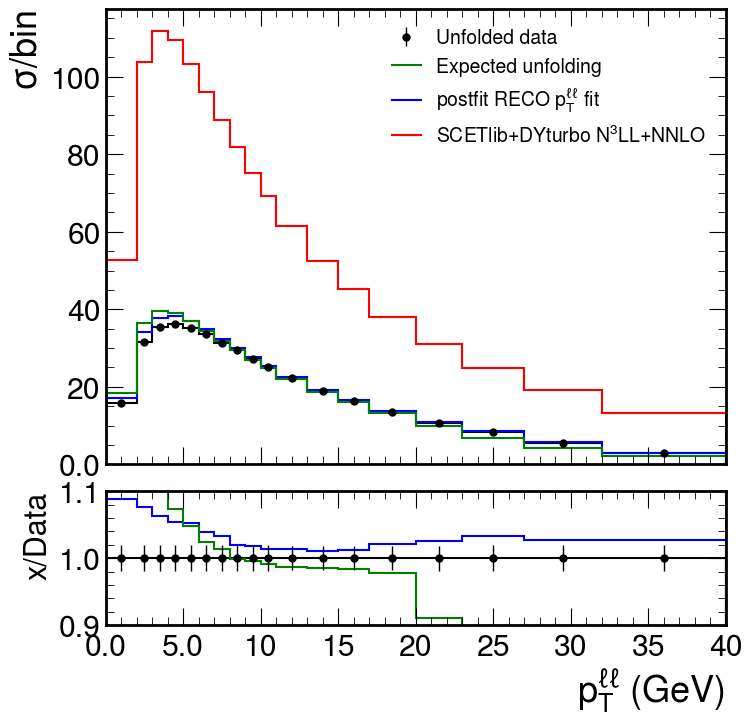

In [188]:
fig = plot_tools.makePlotWithRatioToRef(
            hists=[
                unfolded_datah[:40j],
                hfid_pt[:40j],
                postfit_pt[...,"Zmumu"],
                unfolded_exph[:40j],
                unfolded_datah[:40j],
            ],
            labels=["",
                    "SCETlib+DYturbo N$^{3}$LL+NNLO",
                    r"postfit RECO $p_{T}^{\ell\ell}$ fit",
                    "Expected unfolding",
                    "Unfolded data",
                   ],
            data=True,
            colors=["black",
                    "red",
                    "blue",
                    "green",
                    "black",
                   ],
            xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
            ylabel="$\sigma$/bin",
            rlabel="x/Data",
            rrange=[0.9, 1.1],
            nlegcols=1,
            xlim=None, binwnorm=1.0, baseline=True, 
    )

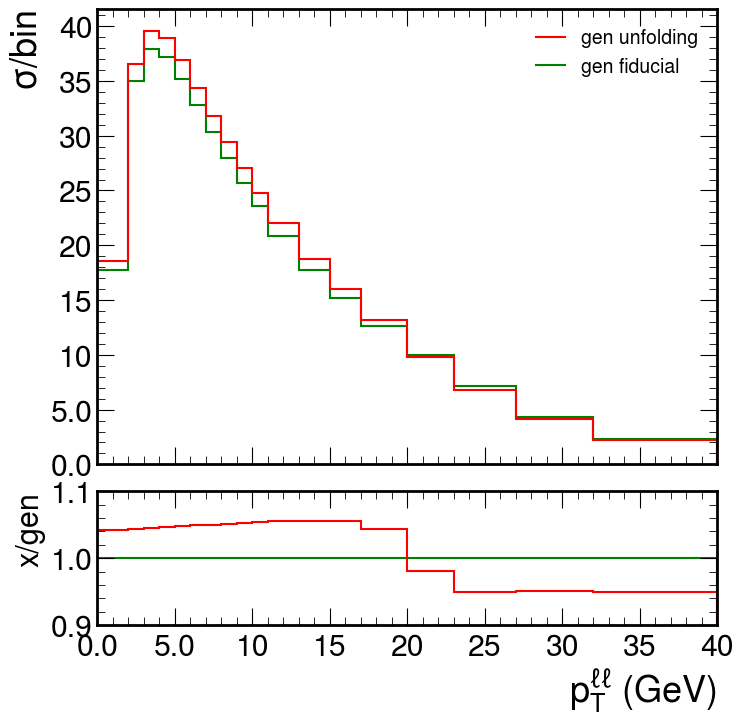

In [246]:
fig = plot_tools.makePlotWithRatioToRef(
            hists=[
                hfid_pt[:40j],
                #unfolded_exph[:40j],
                pt_gen_unfolding.project("ptVGen")[:40j],
            ],
            labels=[
                    "gen fiducial",
                    #"Expected unfolding",
                    "gen unfolding",
                   ],
            colors=[
                    "green",
                    #"blue",
                    "red",
                   ],
            xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
            ylabel="$\sigma$/bin",
            rlabel="x/gen",
            rrange=[0.9, 1.1],
            nlegcols=1,
            xlim=None, binwnorm=1.0, baseline=True, 
    )

In [84]:
filename = "/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen_fiducial//ZGen.hdf5"
indata = narf.combineutils.FitInputData(filename)
debug = narf.combineutils.FitDebugData(indata)


In [85]:
yields = [-abs(debug.syst_hists["ch0"][{"systs" : s, "DownUp" : "Up"}].sum()-debug.nominal_hists["ch0"].sum()) for s in debug.syst_hists["ch0"].axes["systs"]]


In [86]:
ordered_systs = np.array(debug.syst_hists["ch0"].axes["systs"])[np.argsort(yields)]

/work/submit/kdlong/WRemnants/wremnants/plot_tools.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  return plt.figure(figsize=(width_scale*8*width,8)), xlim


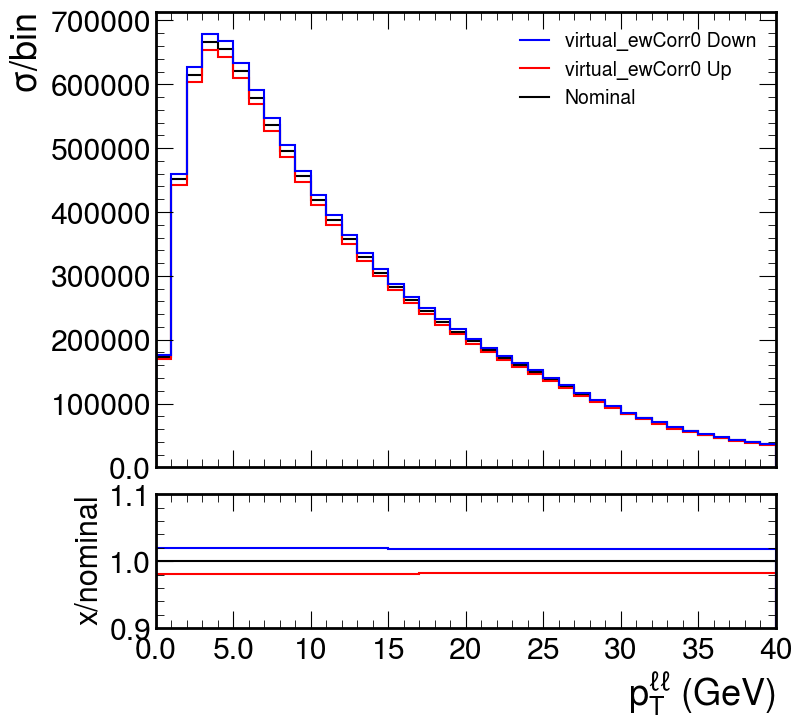

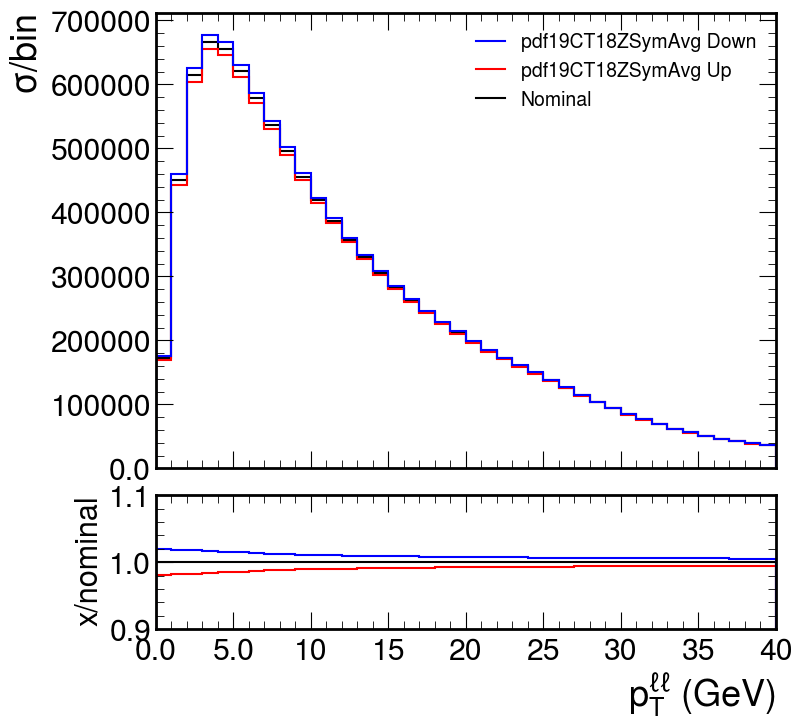

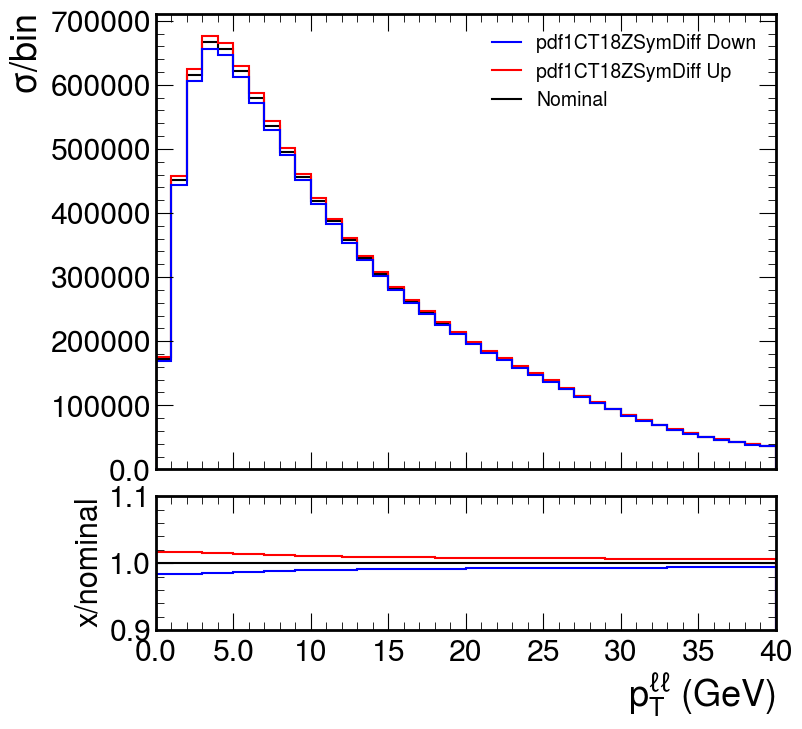

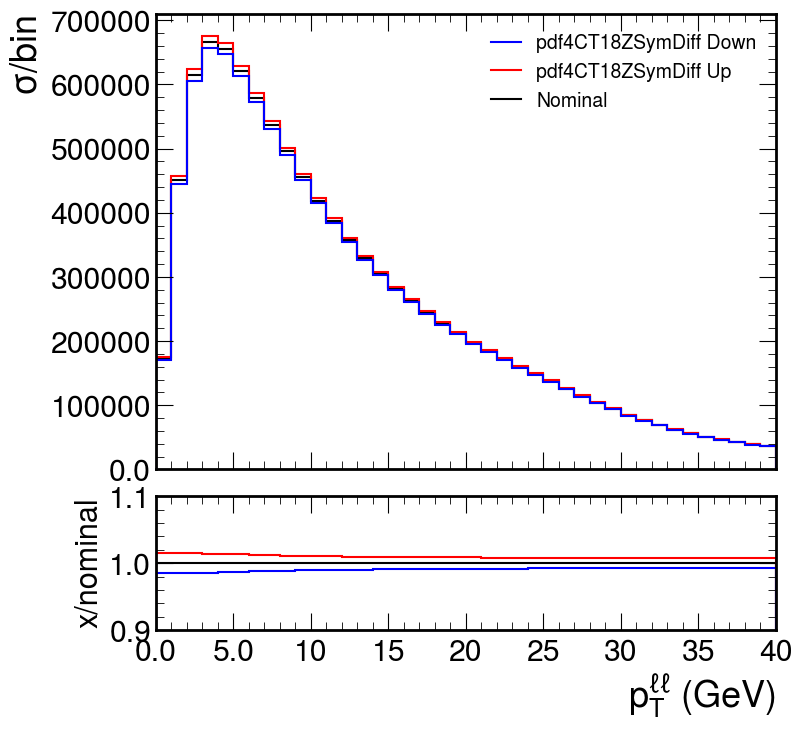

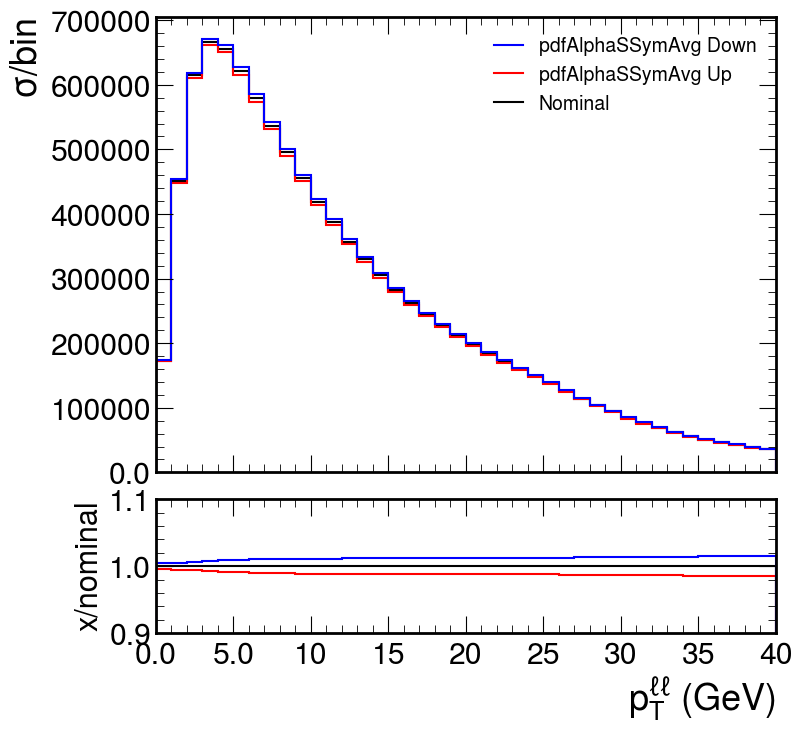

...

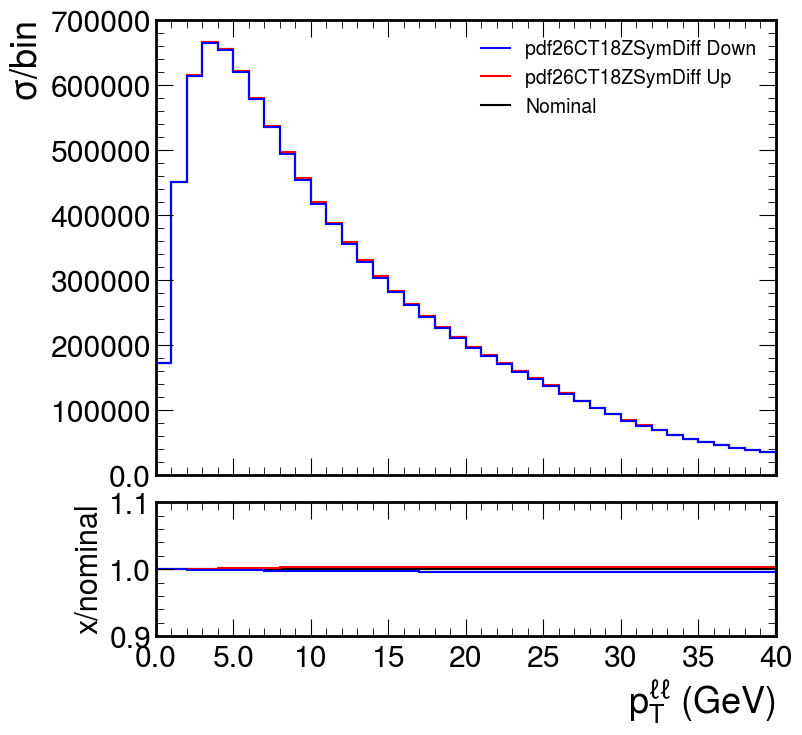

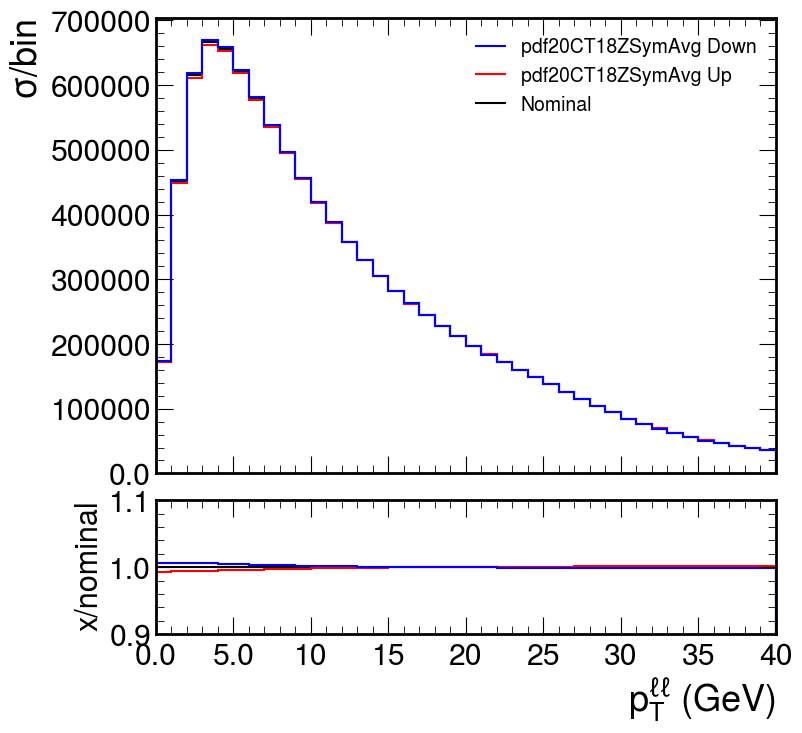

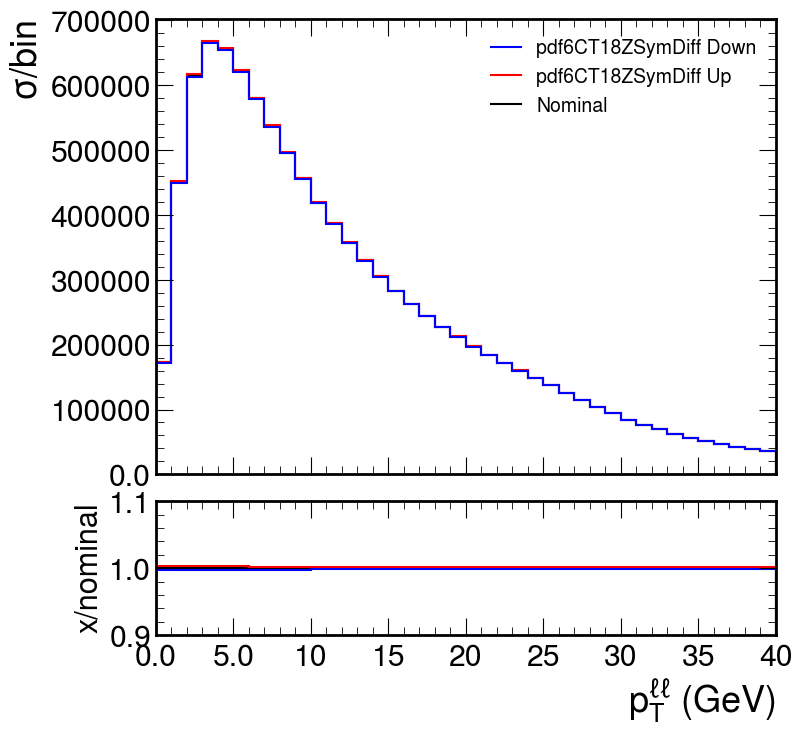

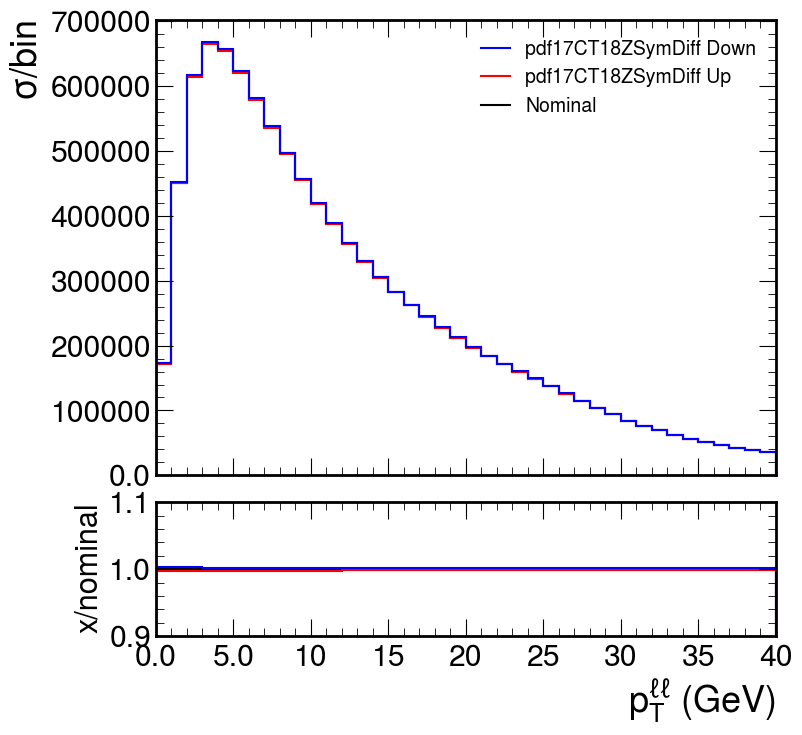

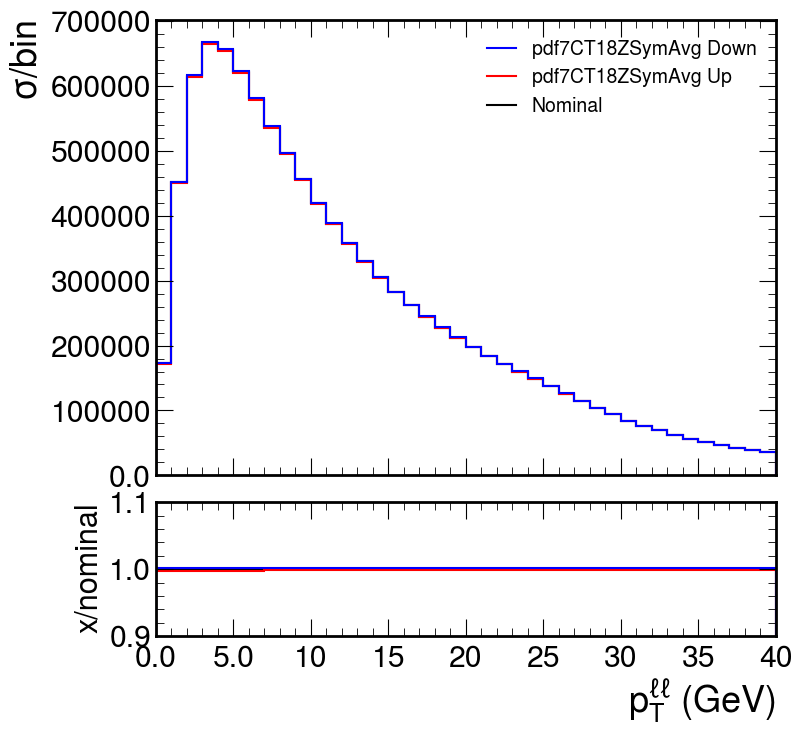

In [87]:
proc = "Zmumu"
for syst in ordered_systs[:50]:
    plot_tools.makePlotWithRatioToRef(
                hists=[
                    debug.nominal_hists["ch0"][{"processes" : proc}],
                    debug.syst_hists["ch0"][{"processes" : proc, "systs" : syst, "DownUp" : "Down"}],
                    debug.syst_hists["ch0"][{"processes" : proc, "systs" : syst, "DownUp" : "Up"}]
                ],
                labels=["Nominal",
                        f"{syst} Up",
                        f"{syst} Down",
                       ],
                colors=["black",
                        "red",
                        "blue",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/nominal",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True, 
        )
    #fig.close()

/work/submit/kdlong/WRemnants/wremnants/plot_tools.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  return plt.figure(figsize=(width_scale*8*width,8)), xlim


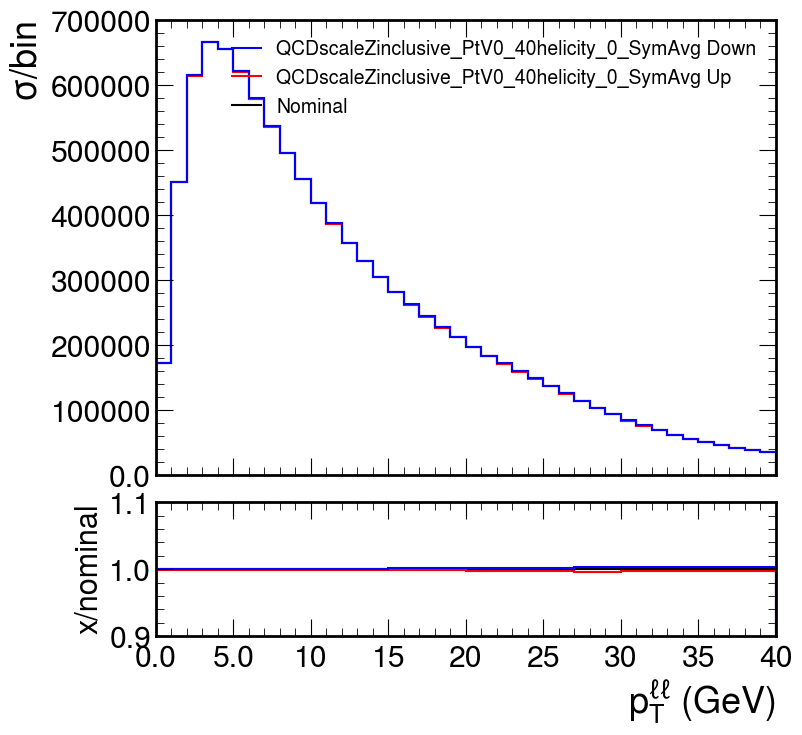

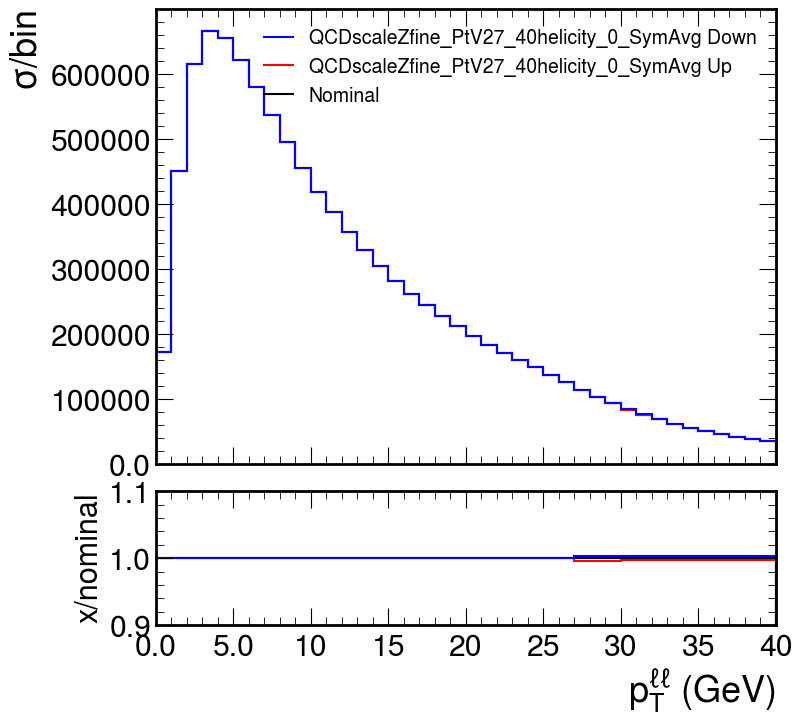

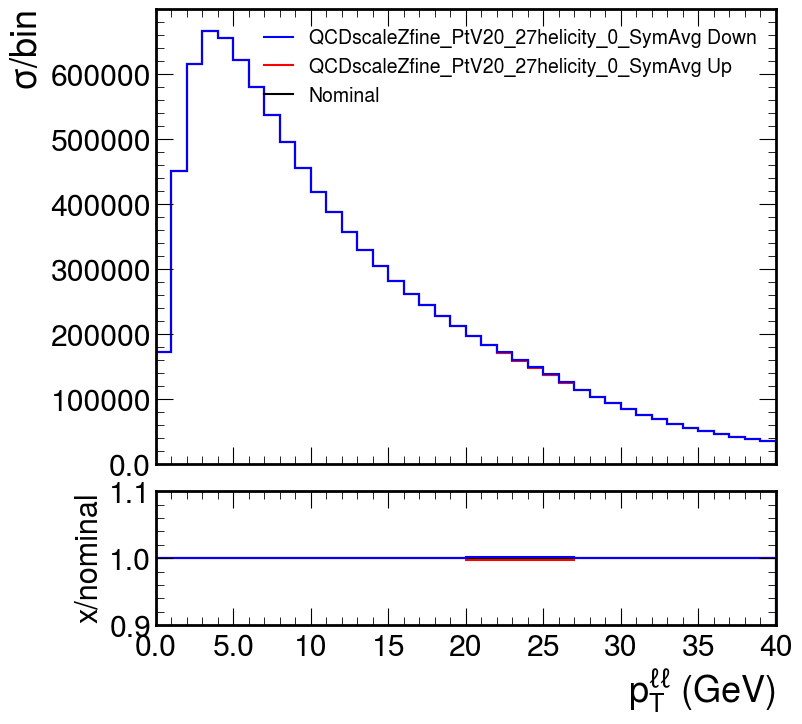

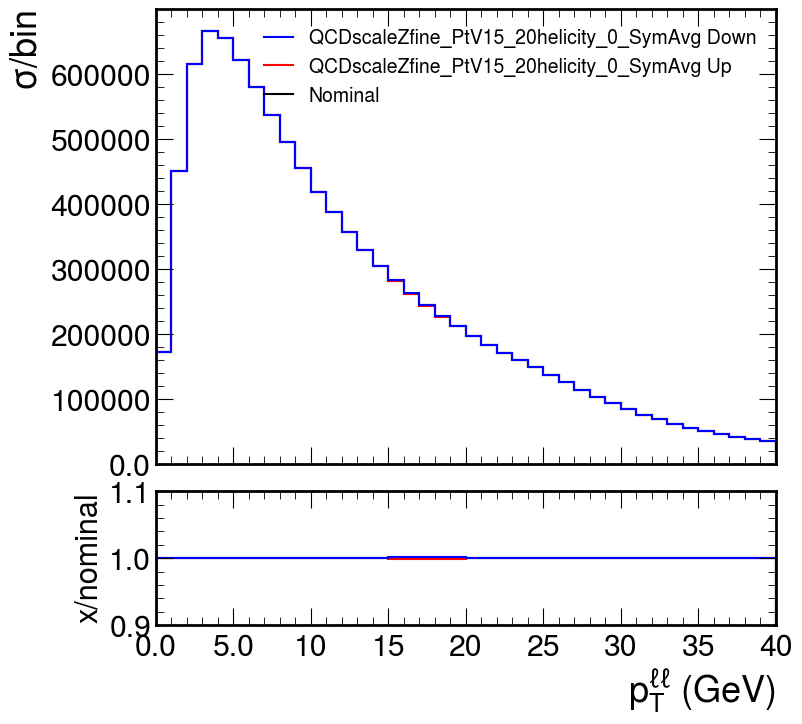

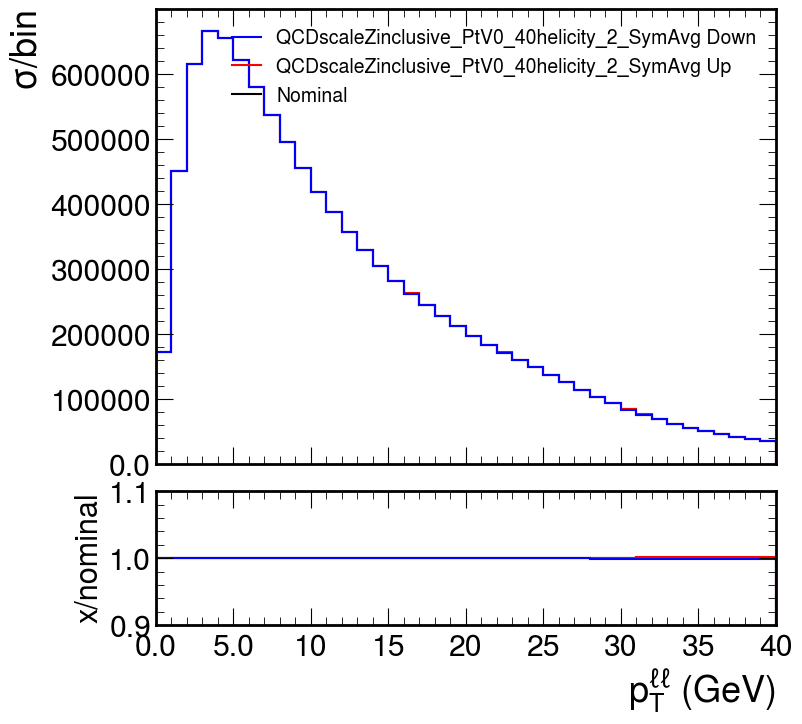

...

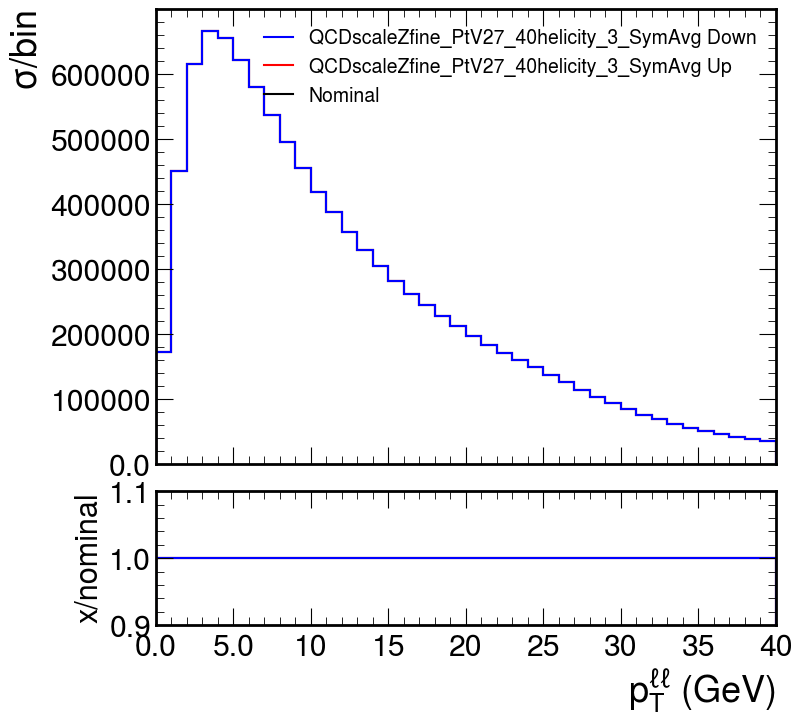

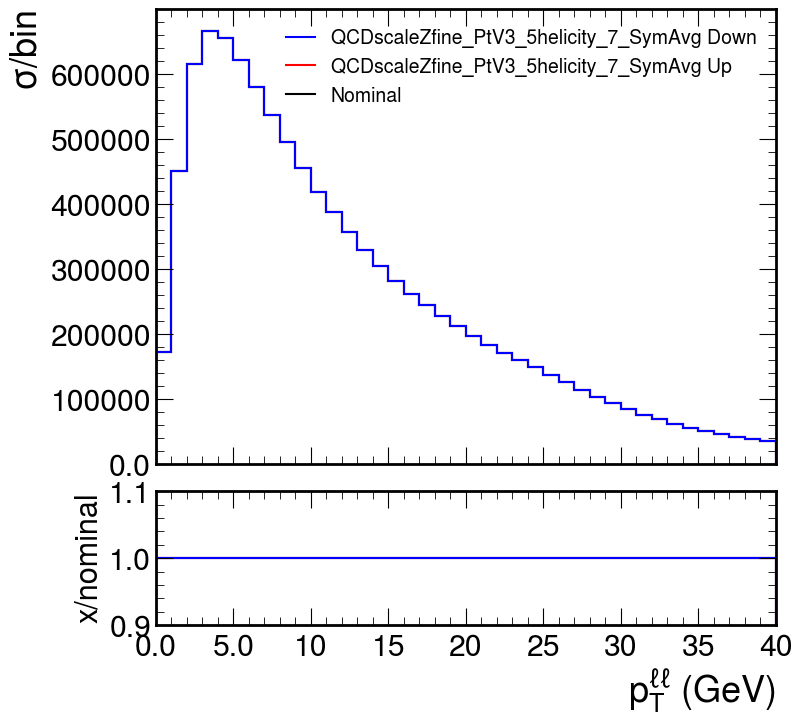

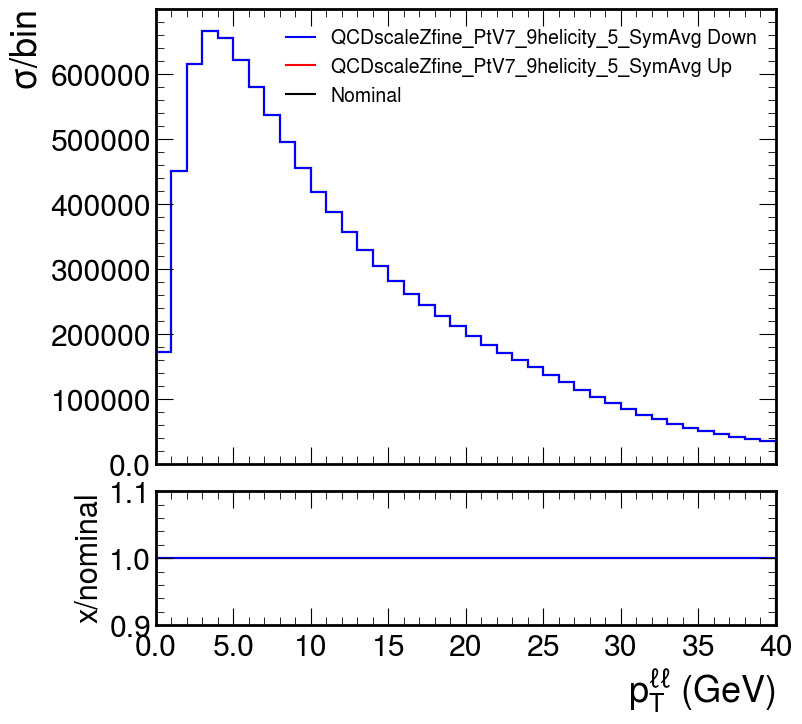

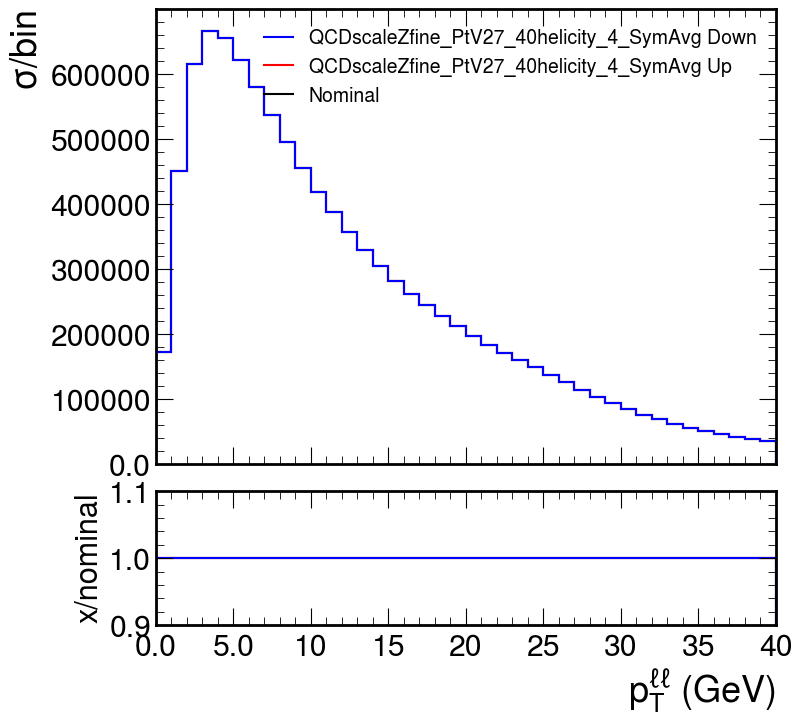

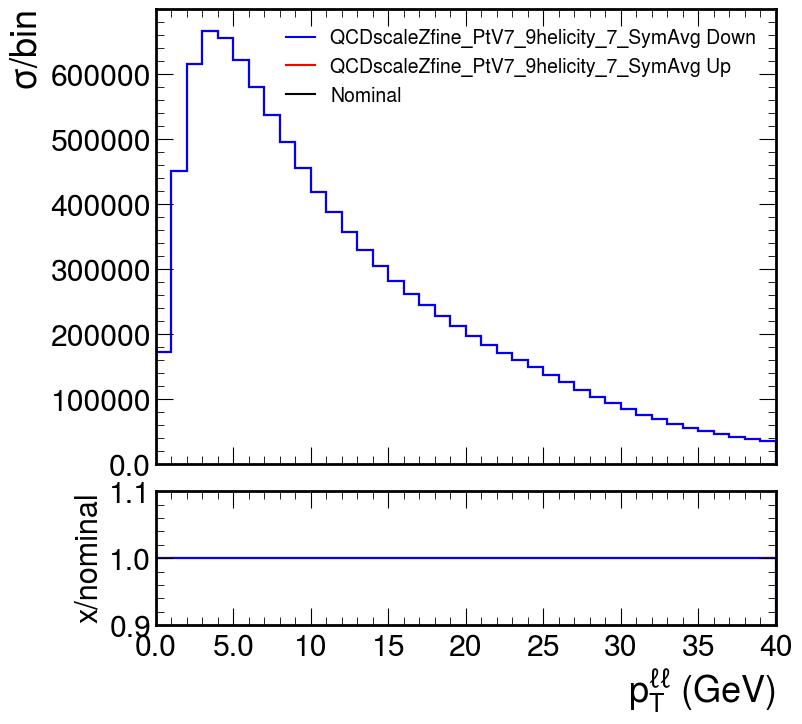

In [91]:
proc = "Zmumu"
for syst in [x for x in ordered_systs if "QCD" in x]:
    plot_tools.makePlotWithRatioToRef(
                hists=[
                    debug.nominal_hists["ch0"][{"processes" : proc}],
                    debug.syst_hists["ch0"][{"processes" : proc, "systs" : syst, "DownUp" : "Down"}],
                    debug.syst_hists["ch0"][{"processes" : proc, "systs" : syst, "DownUp" : "Up"}]
                ],
                labels=["Nominal",
                        f"{syst} Up",
                        f"{syst} Down",
                       ],
                colors=["black",
                        "red",
                        "blue",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/nominal",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True, 
        )
    #fig.close()

In [227]:
pt_gen = input_tools.read_and_scale("/scratch/submit/cms/kdlong/Analysis/w_z_gen_dists_scetlib_dyturboN3p0LLCorr_fiducial_wlike.hdf5", "ZmumuPostVFP", "nominal_genlep")

In [218]:
pt_unfolded = pickle.load(open("/scratch/submit/cms/kdlong/CombineStudies/Unfolding/ZMassWLike_eta_pt_charge/results_unfolded.pkl", "rb"))

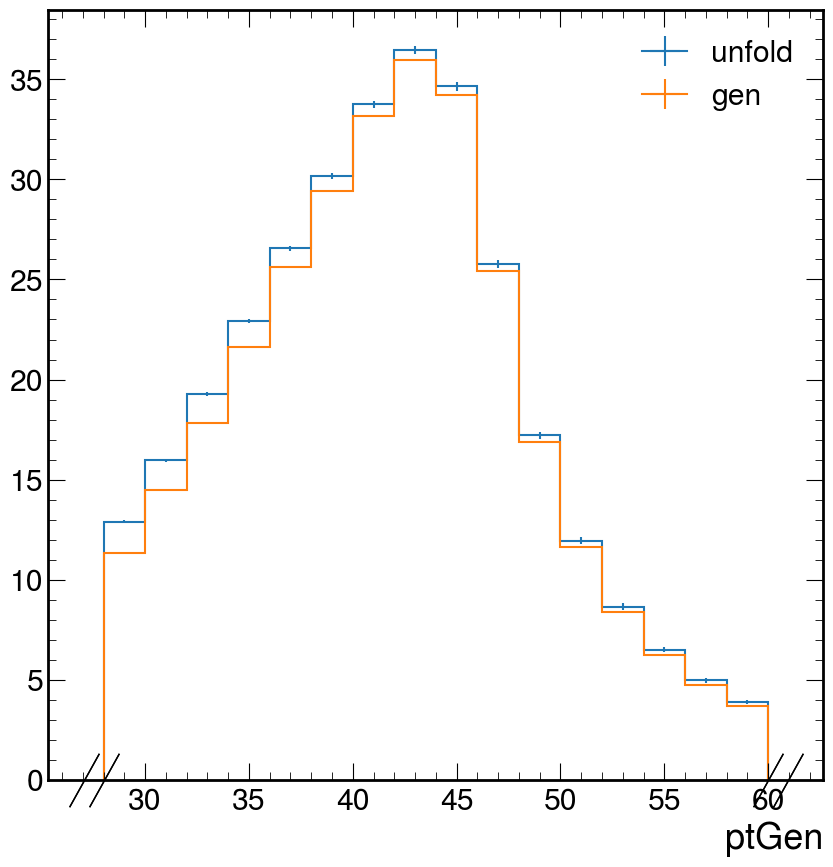

In [234]:
pt_unfolded["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptGen_absEtaGen"].project("ptGen").plot(binwnorm=1., label="unfold")
pt_gen.project("pt")[28j::hist.rebin(2)].plot(label="gen", binwnorm=1.)
plt.legend()

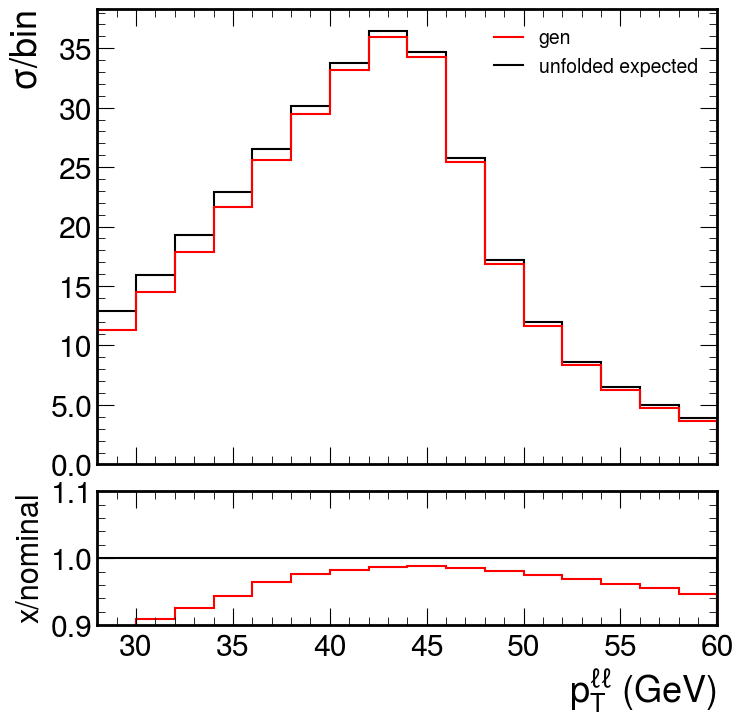

In [236]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    pt_unfolded["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptGen_absEtaGen"].project("ptGen"),
                    pt_gen.project("pt")[28j::hist.rebin(2)]
                ],
                labels=["unfolded expected",
                        "gen",
                       ],
                colors=["black",
                        "red",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/nominal",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True, 
)

In [5]:
gen_inc = input_tools.read_and_scale("/scratch/submit/cms/kdlong/Analysis/w_z_gen_dists_scetlib_dyturboN3p0LLCorr_maxFiles_m1_masswindow_ptVbins.hdf5", "ZmumuPostVFP", "nominal_gen")


In [6]:
gen_unfolding_inc = input_tools.read_and_scale("/scratch/submit/cms/kdlong/Analysis/mz_dilepton_scetlib_dyturboN3p0LLCorr_unfolding.hdf5", "ZmumuPostVFP", "xnorm")
gen_unfolding_inc

Hist(
  Regular(1, 0, 1, underflow=False, overflow=False, name='count'),
  Variable(array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  13.,  15.,  17.,  20.,  23.,  27.,  32.,  40.,  54., 100.]), underflow=False, name='ptVGen'),
  Regular(10, 0, 2.5, underflow=False, name='absYVGen'),
  storage=Weight()) # Sum: WeightedSum(value=1340.48, variance=0.037064) (WeightedSum(value=1941.59, variance=0.0561708) with flow)

In [9]:
unfolding_inc_data = pickle.load(open("/scratch/submit/cms/kdlong/CombineStudies/Unfolding/ZMassDilepton_ptll_inclusive_ptV1GeV/results_unfolded.pkl", "rb"))
#unfolding_inch = unfolding_inc["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptVGen"]
#unfolding_inc_datah = unfolding_inc_data["results"]["sumpois"]["chan_13TeV"]["Z"]["hist_ptVGen"]
unfolding_inc_datah = unfolding_inc_data["results"]["pmaskedexp"]["chan_13TeV"]["Z"]["hist_ptVGen"]

In [12]:
res_n3p0ll_data = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies//ZGen_ptVgen/ZGen_postfit_recoFitToData.hdf5")

# 

In [14]:
res_n3p0ll_wlikefit = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow_ptbin/wlikePtllCorrPDFit_N3p0LL.hdf5")
res_n3p0ll_ptlldatafit = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow_ptbin/ptllDataFit_N3p0LL.hdf5")


In [15]:
n3p0ll_wlikefith = hh.rebinHist(res_n3p0ll_wlikefit["hist_postfit_inclusive"]["ch0"].get(), "ptVgen", unfolding_inc_datah.axes["ptVGen"].edges)/1000.
n3p0ll_ptlldatafith = hh.rebinHist(res_n3p0ll_ptlldatafit["hist_postfit_inclusive"]["ch0"].get(), "ptVgen", unfolding_inc_datah.axes["ptVGen"].edges)/1000.


In [760]:
prefit_datah = hh.rebinHist(res_n3p0ll_data["hist_prefit_inclusive"]["ch0"].get(), "ptVgen", unfolding_inc_datah.axes["ptVGen"].edges)/1000.
postfit_datah = hh.rebinHist(res_n3p0ll_data["hist_postfit_inclusive"]["ch0"].get(), "ptVgen", unfolding_inc_datah.axes["ptVGen"].edges)/1000.

In [19]:
ptllup, ptlldown = hist_to_up_down_unc(n3p0ll_ptlldatafith)
wlikeup, wlikedown = hist_to_up_down_unc(n3p0ll_wlikefith)

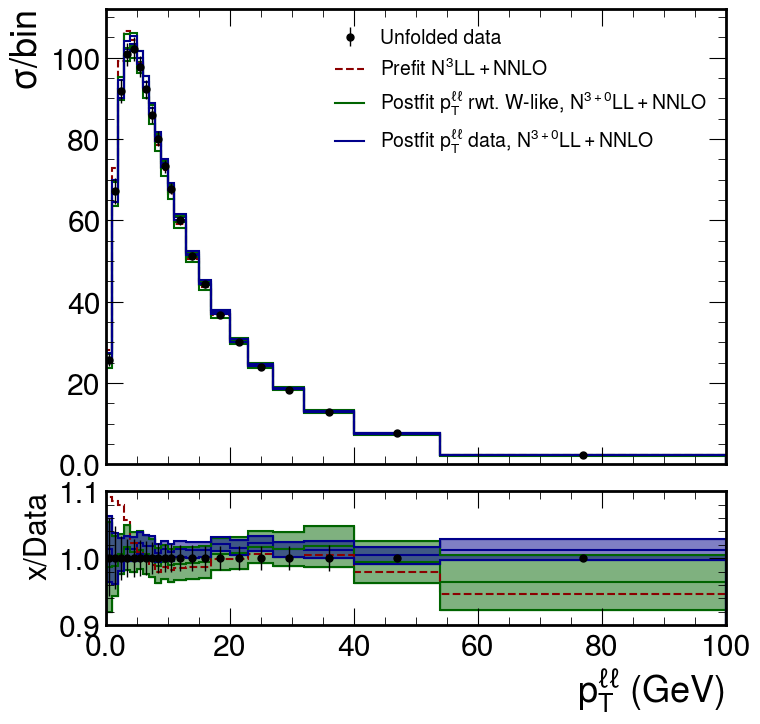

In [42]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    unfolding_inc_datah,
                    n3p0ll_ptlldatafith,
                    n3p0ll_wlikefith,
                    gen_inc.project("ptVgen"),
                    wlikeup,
                    wlikedown,
                    ptllup,
                    ptlldown,
                ],
                labels=[
                        "Unfolded data",
                        r"Postfit $p_{T}^{\ell\ell}$ data, N$^{3+0}LL+NNLO$",
                        r"Postfit $p_{T}^{\ell\ell}$ rwt. W-like, N$^{3+0}LL+NNLO$",
                        r"Prefit N$^{3}LL+NNLO$",
                        "", "", "", "",
                       ],
                dataIdx=0,
                colors=[
                        "black",
                        "darkblue",
                        "darkgreen",
                        "darkred",
                        "darkgreen",
                        "darkgreen",
                        "darkblue",
                        "darkblue",
                       ],
                linestyles=["solid"]*3+["dashed"]+["solid"]*2,
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel=r"x/Data",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=4,
)

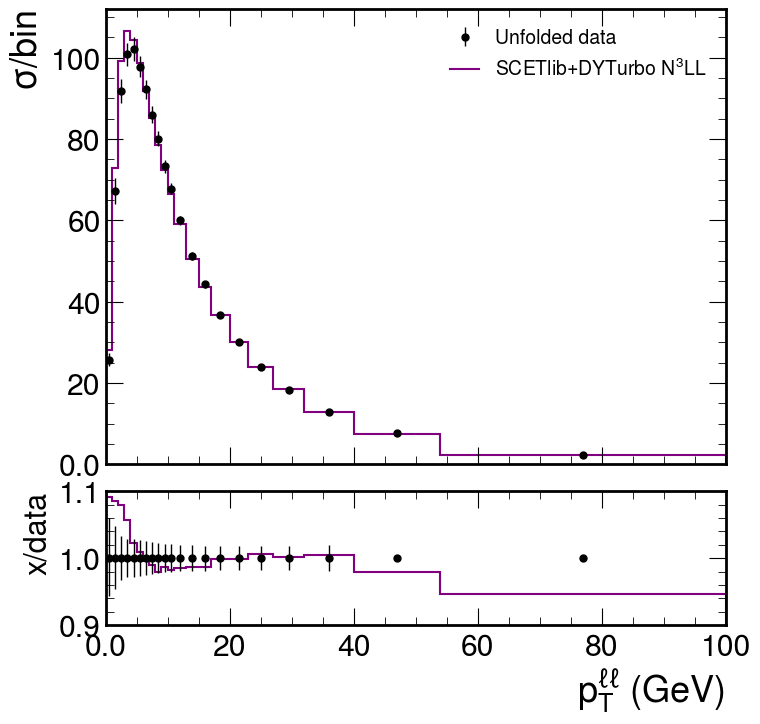

In [775]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    unfolding_inc_datah,
                    #postfit_datah,
                    gen_inc.project("ptVgen"),
                ],
                labels=["Unfolded data",
                        #"SCETlib+DYTurbo N$^{3+0}$LL postfit",
                        "SCETlib+DYTurbo N$^{3}$LL",
                       ],
                dataIdx=0,
                colors=[
                        "black",
                        #"mediumpurple",
                        "purple",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/data",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
)

In [517]:
hup, hdown = hist_to_up_down_unc(postfit_datah)

In [ ]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    postfit_datah,
                    hup,
                    hdown,
                    gen_inc,
                    unfolding_inc_datah,
                ],
                labels=[
                        "SCETlib+DYTurbo N$^{3+0}$LL postfit",
                        "",
                        "",
                        "SCETlib+DYTurbo N$^{3}$LL",
                        "unfolded data",

                       ],
                data=True,
                colors=[
                        "mediumpurple",
                        "mediumpurple",
                        "mediumpurple",
                        "purple",
                        "black",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/postfit",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=2,
)

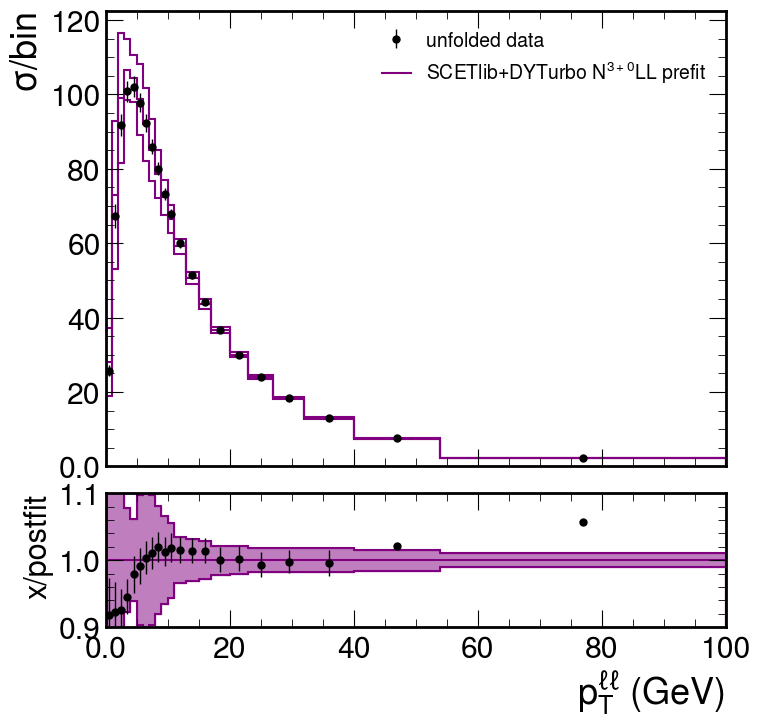

In [609]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    prefit_datah,
                    unfolding_inc_datah,
                    preup,
                    predown,
                ],
                labels=[
                        "SCETlib+DYTurbo N$^{3+0}$LL prefit",
                        "unfolded data",
                        "",
                        "",

                       ],
                dataIdx=1,
                colors=[
                        "purple",
                        "black",
                        "purple",
                        "purple",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/postfit",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=2,
)

In [418]:
import lz4.frame,pickle

In [427]:
resz = pickle.load(lz4.frame.open("/home/submit/kdlong/work/WRemnants/wremnants-data/data/TheoryCorrections/dataPtllCorrZ.pkl.lz4"))

In [618]:
ptllfit_gen_expected = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow/ptllDataFit_N3p0LL_expected.hdf5")
ptllfit_gen_expectedh = ptllfit_gen_expected["hist_postfit_inclusive"]["ch0"].get()[:100j]
ptllfit_gen_expectedh_up,ptllfit_gen_expectedh_down = hist_to_up_down_unc(ptllfit_gen_expectedh)
gen_prefit_up,gen_prefit_down = hist_to_up_down_unc(ptllfit_gen_expected["hist_prefit_inclusive"]["ch0"].get()[:100j])

In [622]:
wlikefit_gen_expected = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow/wlikePtllCorrPDFit_N3p0LL_expected.hdf5")
wlikefit_gen_expectedh = wlikefit_gen_expected["hist_postfit_inclusive"]["ch0"].get()[:100j]
wlikefit_gen_expectedh_up,wlikefit_gen_expectedh_down = hist_to_up_down_unc(wlikefit_gen_expectedh)


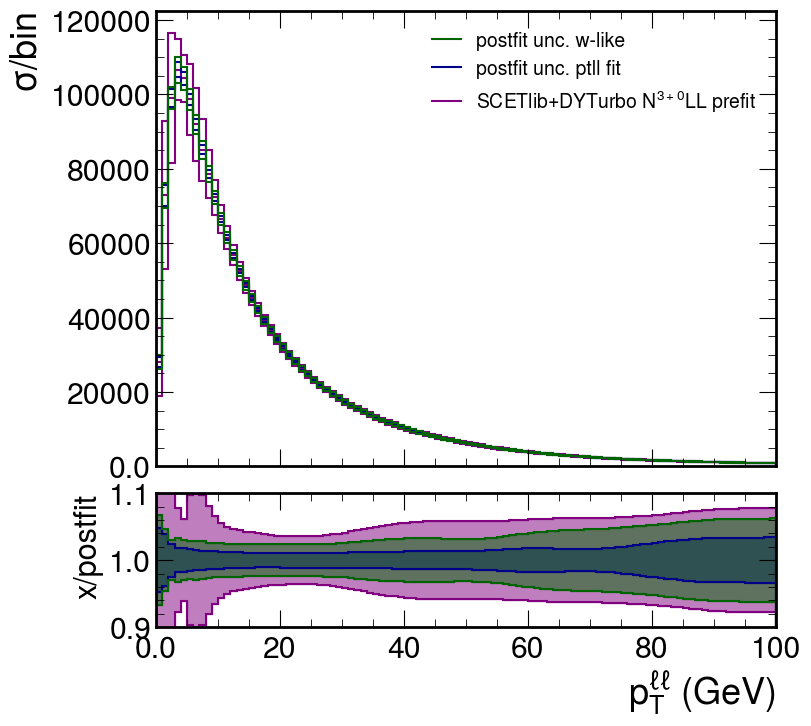

In [632]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    ptllfit_gen_expectedh,
                    gen_prefit_up,
                    gen_prefit_down,
                    ptllfit_gen_expectedh_up,
                    ptllfit_gen_expectedh_down,
                    wlikefit_gen_expectedh_up,
                    wlikefit_gen_expectedh_down,
                ],
                labels=[
                        "SCETlib+DYTurbo N$^{3+0}$LL prefit",
                        "",
                        "",
                        "postfit unc. ptll fit",
                        "",
                        "postfit unc. w-like",
                        "",
                       ],
                colors=[
                        "purple",
                        "purple",
                        "purple",
                        "darkblue",
                        "darkblue",
                        "darkgreen",
                        "darkgreen",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/postfit",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=False,
                yerr=False,
                fill_between=6,
)

In [637]:
ptllfit_gen = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow/ptllDataFit_N3p0LL.hdf5")
ptllfit_genh = ptllfit_gen["hist_postfit_inclusive"]["ch0"].get()[:100j]
ptllfit_genh_up,ptllfit_genh_down = hist_to_up_down_unc(ptllfit_genh)


In [636]:
wlikefit_gen = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/ZGen_ptVgen_N3p0LL_masswindow/wlikePtllCorrPDFit_N3p0LL.hdf5")
wlikefit_genh = wlikefit_gen["hist_postfit_inclusive"]["ch0"].get()[:100j]
wlikefit_genh_up,wlikefit_genh_down = hist_to_up_down_unc(wlikefit_genh)

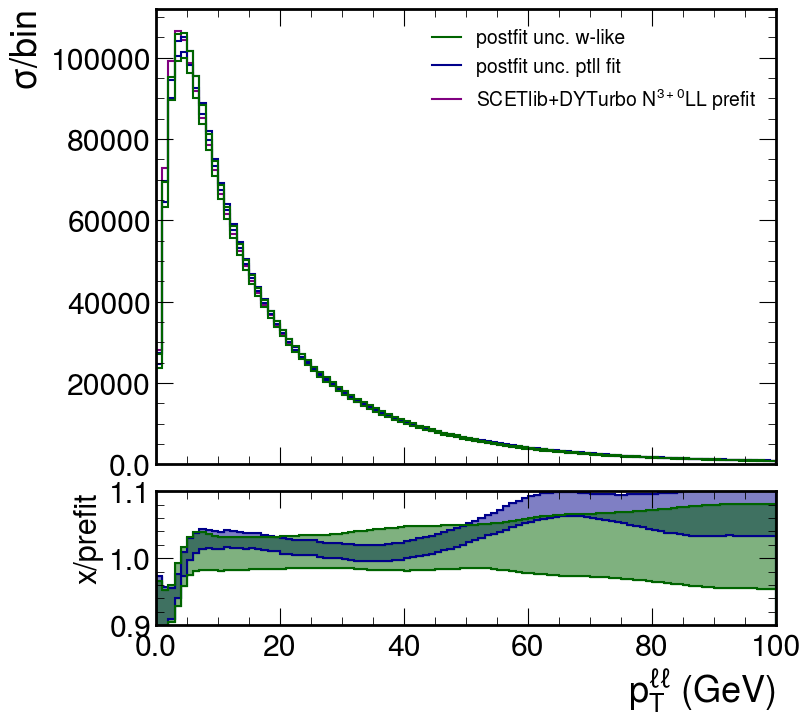

In [639]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    ptllfit_gen_expectedh,
                    ptllfit_genh_up,
                    ptllfit_genh_down,
                    wlikefit_genh_up,
                    wlikefit_genh_down,
                ],
                labels=[
                        "SCETlib+DYTurbo N$^{3+0}$LL prefit",
                        "postfit unc. ptll fit",
                        "",
                        "postfit unc. w-like",
                        "",
                       ],
                colors=[
                        "purple",
                        "darkblue",
                        "darkblue",
                        "darkgreen",
                        "darkgreen",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/prefit",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=False,
                yerr=False,
                fill_between=4,
)

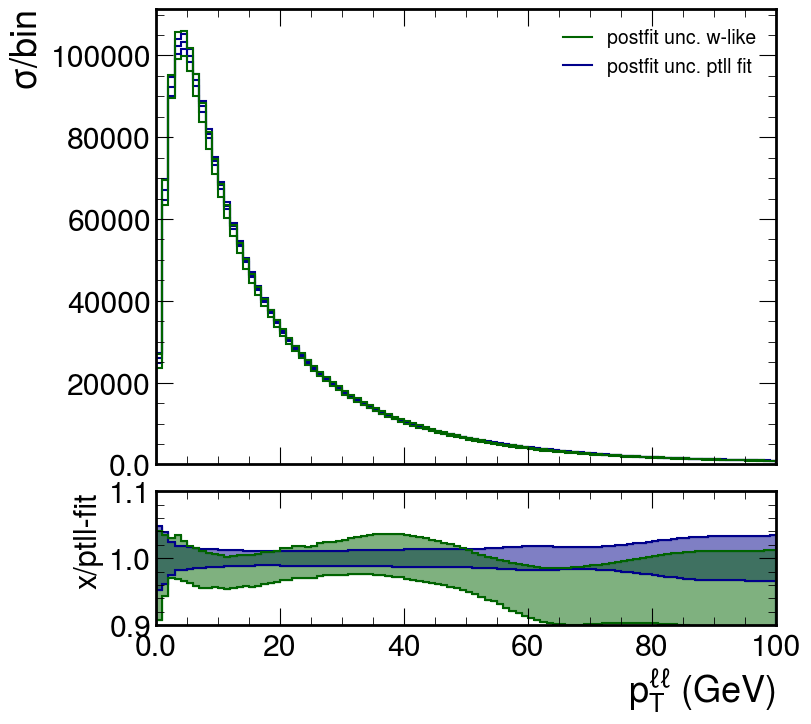

In [643]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    ptllfit_genh,
                    ptllfit_genh_up,
                    ptllfit_genh_down,
                    wlikefit_genh_up,
                    wlikefit_genh_down,
                ],
                labels=["",
                        "postfit unc. ptll fit",
                        "",
                        "postfit unc. w-like",
                        "",
                       ],
                colors=[
                        "darkblue",
                        "darkblue",
                        "darkblue",
                        "darkgreen",
                        "darkgreen",
                       ],
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel="x/ptll-fit",
                rrange=[0.9, 1.1],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=False,
                yerr=False,
                fill_between=4,
)

# 

In [35]:
mw_gen_prefit = input_tools.read_all_and_scale("/scratch/submit/cms/kdlong/Analysis/w_z_gen_dists_scetlib_dyturboN3p0LLCorr_maxFiles_m1_masswindow_ptVbins.hdf5", ["WminusmunuPostVFP", "WplusmunuPostVFP"], ["nominal_gen"])

In [36]:
mw_combined_n3p0ll_ptlldatafit = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/WGen_ptVgen_N3p0LL_ptVbin/mw_combinedZ_ptllCorrPDFit_N3p0LL.hdf5")
mw_combined_h = mw_combined_n3p0ll_ptlldatafit["hist_postfit_inclusive"]["ch0"].get()
mw_combined_uph,mw_combined_downh = hist_to_up_down_unc(mw_combined_h)

In [37]:
mw_n3p0ll_ptlldatafit = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/WGen_ptVgen_N3p0LL_ptVbin/mw_ptllCorrPDFit_N3p0LL.hdf5")
mw_h = mw_n3p0ll_ptlldatafit["hist_postfit_inclusive"]["ch0"].get()
mw_uph,mw_downh = hist_to_up_down_unc(mw_h)

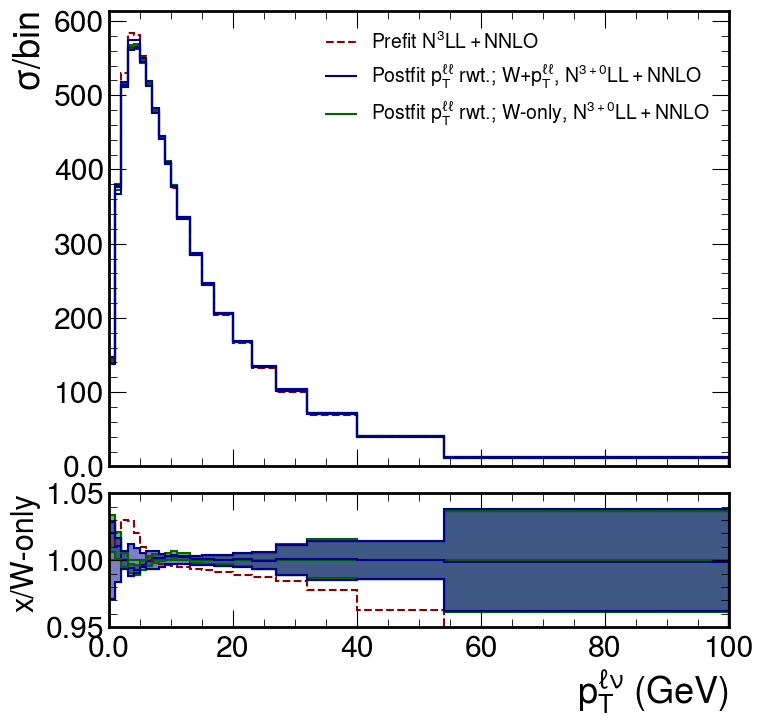

In [41]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    mw_h*1/1000,
                    mw_combined_h*1/1000,
                    mw_gen_prefit[0].project("ptVgen")And ,
                    mw_combined_uph*1/1000,
                    mw_combined_downh*1/1000,
                    mw_uph*1/1000,
                    mw_downh*1/1000,
                ],
                labels=[
                        r"Postfit $p_{T}^{\ell\ell}$ rwt.; W-only, N$^{3+0}LL+NNLO$",
                        r"Postfit $p_{T}^{\ell\ell}$ rwt.; W+$p_{T}^{\ell\ell}$, N$^{3+0}LL+NNLO$",
                        r"Prefit N$^{3}LL+NNLO$",
                        "", "", "", "",
                       ],
                colors=[
                        "darkgreen",
                        "darkblue",
                        "darkred",
                        "darkgreen",
                        "darkgreen",
                        "darkblue",
                        "darkblue",
                       ],
                linestyles=["solid"]*2+["dashed"]+["solid"]*4,
                xlabel=r"p$_{T}^{\ell\nu}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel=r"x/W-only",
                rrange=[0.95, 1.05],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=4,
)

In [830]:
mw_combined_n3p0ll_exp = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/WGen_ptVgen_N3p0LL_ptVbin/mw_combinedZ_N3p0LL_expected.hdf5")
mw_combined_exp_h = mw_combined_n3p0ll_exp["hist_postfit_inclusive"]["ch0"].get()
mw_combined_exp_uph,mw_combined_exp_downh = hist_to_up_down_unc(mw_combined_exp_h)

In [831]:
mw_n3p0ll_exp = combinetf2_input.get_fitresult("/scratch/submit/cms/kdlong/CombineStudies/TheoryBiasStudies/WGen_ptVgen_N3p0LL_ptVbin/mw_N3p0LL_expected.hdf5")
mw_exp_h = mw_n3p0ll_exp["hist_postfit_inclusive"]["ch0"].get()
mw_exp_uph,mw_exp_downh = hist_to_up_down_unc(mw_exp_h)

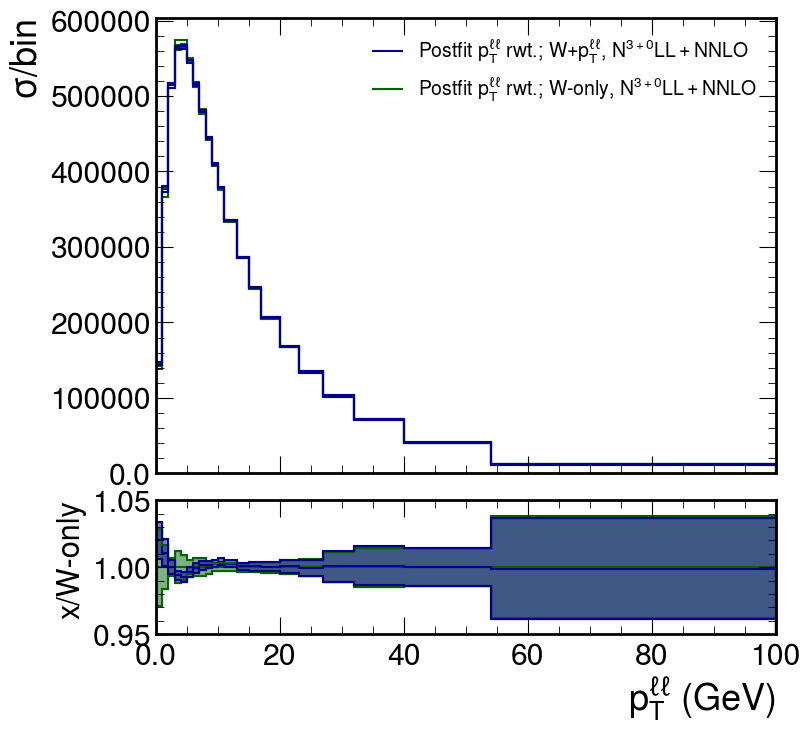

In [836]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    mw_h,
                    mw_combined_h,
                    mw_uph,
                    mw_downh,
                    mw_combined_uph,
                    mw_combined_downh,
                ],
                labels=[
                        r"Postfit $p_{T}^{\ell\ell}$ rwt.; W-only, N$^{3+0}LL+NNLO$",
                        r"Postfit $p_{T}^{\ell\ell}$ rwt.; W+$p_{T}^{\ell\ell}$, N$^{3+0}LL+NNLO$",
                        "", "", "", "",
                       ],
                colors=[
                        "darkgreen",
                        "darkblue",
                        "darkgreen",
                        "darkgreen",
                        "darkblue",
                        "darkblue",
                       ],
                linestyles=["solid"]*6,
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel=r"x/W-only",
                rrange=[0.95, 1.05],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=4,
)

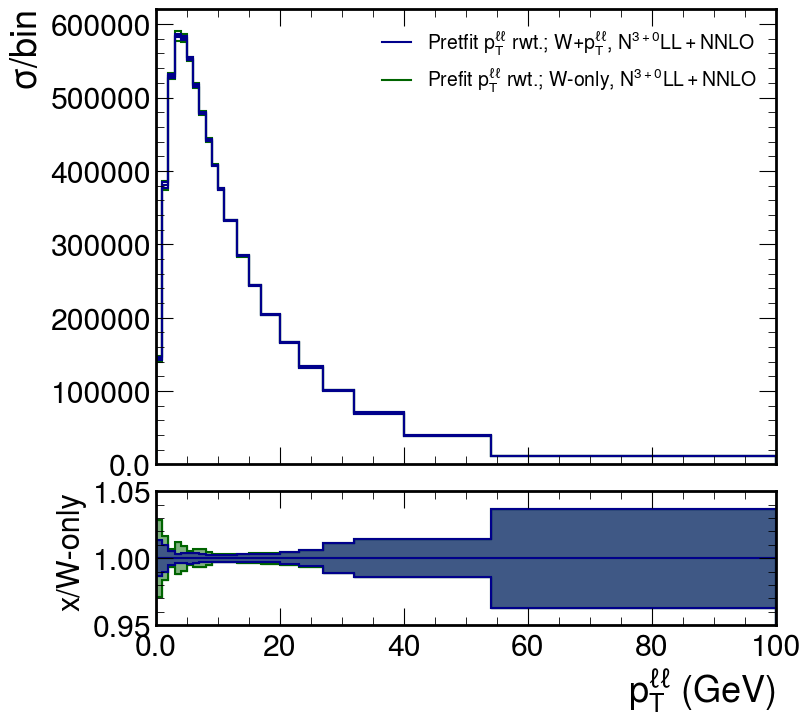

In [835]:
fig = plot_tools.makePlotWithRatioToRef(
                hists=[
                    mw_exp_h,
                    mw_combined_exp_h,
                    mw_exp_uph,
                    mw_exp_downh,
                    mw_combined_exp_uph,
                    mw_combined_exp_downh,
                ],
                labels=[
                        r"Prefit $p_{T}^{\ell\ell}$ rwt.; W-only, N$^{3+0}LL+NNLO$",
                        r"Pretfit $p_{T}^{\ell\ell}$ rwt.; W+$p_{T}^{\ell\ell}$, N$^{3+0}LL+NNLO$",
                        "", "", "", "",
                       ],
                colors=[
                        "darkgreen",
                        "darkblue",
                        "darkgreen",
                        "darkgreen",
                        "darkblue",
                        "darkblue",
                       ],
                linestyles=["solid"]*6,
                xlabel="p$_{T}^{\ell\ell}$ (GeV)", 
                ylabel="$\sigma$/bin",
                rlabel=r"x/W-only",
                rrange=[0.95, 1.05],
                nlegcols=1,
                xlim=None, binwnorm=1.0, baseline=True,
                yerr=False,
                fill_between=4,
)